In [ ]:
import pandas as pd
import numpy as np

In [2]:
import seaborn as sns

In [3]:
import matplotlib as plt

In [4]:
df=pd.read_csv(r"E:\you tube\placement.csv")

In [5]:
print(df.shape)
df.head()

(100, 3)


,cgpa,resume_score,placed
0,8.14,6.52,1
1,6.17,5.17,0
2,8.27,8.86,1
3,6.88,7.27,1
4,7.52,7.30,1


<Axes: xlabel='cgpa', ylabel='resume_score'>

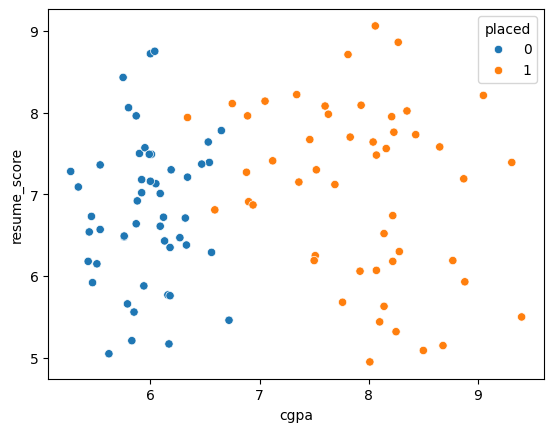

In [6]:
sns.scatterplot(x=df['cgpa'], y=df['resume_score'], hue=df['placed'])

In [7]:
x=df.iloc[:,0:2]
y=df.iloc[:,-1]

In [8]:
from sklearn.linear_model import Perceptron
p=Perceptron()

In [9]:
p.fit(x, y)

,penalty,None
,alpha,0.0001
,l1_ratio,0.15
,fit_intercept,True
,max_iter,1000
,tol,0.001
,shuffle,True
,verbose,0
,eta0,1.0
,n_jobs,None
,random_state,0


In [10]:
p.coef_

array([[ 40.26, -36.  ]])

In [11]:
p.intercept_

array([-25.])

In [12]:
from mlxtend.plotting import plot_decision_regions

C:\Users\prach\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but Perceptron was fitted with feature names
  warnings.warn(


<Axes: >

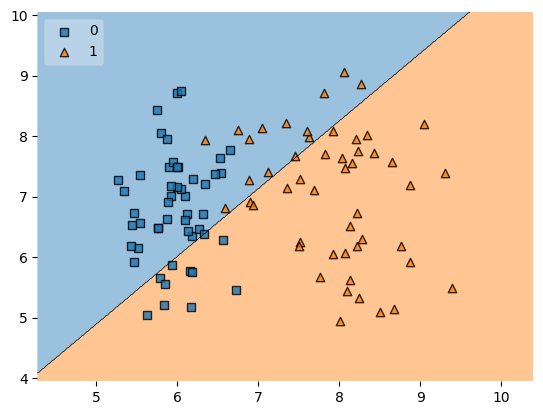

In [13]:
plot_decision_regions(x.values, y.values, clf=p, legend=2)

In [14]:
from sklearn.datasets import make_classification
x, y=make_classification(n_samples=100, n_features=2, n_informative=1, n_redundant=0,
                         n_classes=2, n_clusters_per_class=1, random_state=41, hypercube=False, class_sep=10)

In [15]:
import matplotlib.pyplot as plt

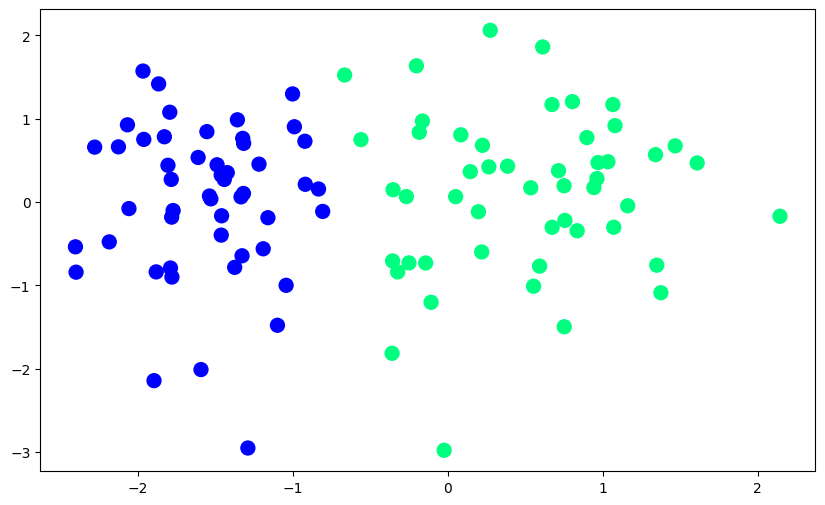

In [16]:
plt.figure(figsize=(10,6))
plt.scatter(x[:,0], x[:,1], c=y, cmap='winter', s=100)

In [17]:
def perceptron(x,y):
    x=np.insert(x, 0, 1, axis=1)
    weights= np.ones(x.shape[1])
    lr=0.1
    for i in range(1000):
        j= np.random.randint(0, 100)
        y_hat= step(np.dot(x[j], weights))
        weights= weights + lr*(y[j]-y_hat)*x[j]

    return weights[0], weights[1:]

In [18]:
def step(z):
    return 1 if z>0 else 0

In [19]:
intercept_, coef_= perceptron(x,y)

In [20]:
print(coef_)
print(intercept_)

[1.34521976 0.05017496]
1.0


In [21]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [22]:
x_input = np.linspace(-3, 3, 100)
y_input = m*x_input + b

(-3.0, 2.0)

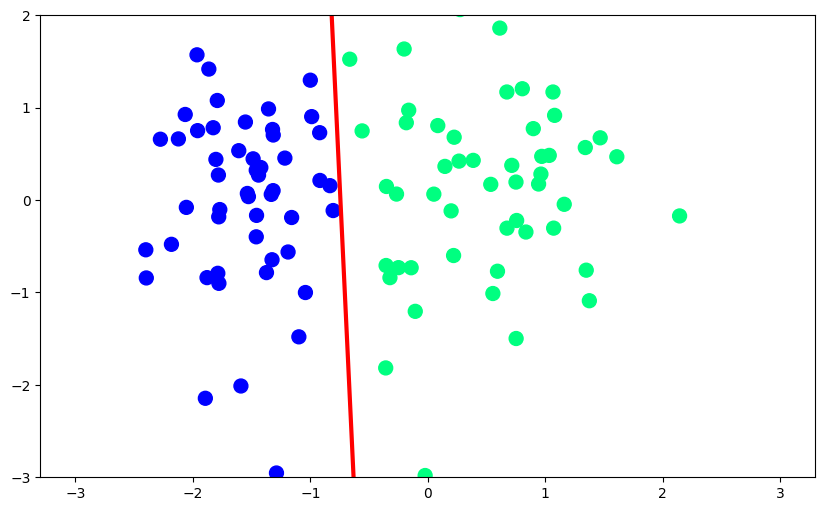

In [23]:
plt.figure(figsize=(10, 6))
plt.plot(x_input, y_input, color='red', linewidth=3)
plt.scatter(x[:,0], x[:,1], c=y, cmap='winter', s=100)
plt.ylim(-3, 2)

In [24]:
# annimation for above figure
def perceptron(x, y):
    m=[]
    b=[]
    x= np.insert(x, 0, 1, axis=1)
    weights =np.ones(x.shape[1])
    lr=0.1

    for i in range(200):
        j=np.random.randint(0, 100)
        y_hat = step(np.dot(x[j], weights))
        weights = weights + lr*(y[j]- y_hat)*x[j]

        m.append(-(weights[1]/weights[2]))
        b.append(-(weights[0]/weights[2]))
    return m, b

In [25]:
m, b =perceptron(x, y)

In [26]:
%matplotlib notebook
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [27]:
fig, ax=plt.subplots(figsize=(9, 5))
x_i = np.arange(-3, 3, 0.1)
y_i = x_i*m[0] + b[0]
ax.scatter(x[:,0], x[:,1], c=y, cmap='winter', s=100)
line, = ax.plot(x_i, x_i*m[0] + b[0], 'r-', linewidth=2)
plt.ylim(-3, 3)
def update(i):
    label = 'epoch{0}'.format(i + 1)
    line.set_ydata(x_i*m[i] + b[i])
    ax.set_xlabel(label)
    #return line, ax
anim= FuncAnimation(fig, update, repeat=True, frames=200, interval=100)
HTML(anim.to_jshtml())


<IPython.core.display.Javascript object>